# Figure and data processing for *Topical Review: Extracting Molecular Frame Photoionization Dynamics from Experimental Data*
18/07/22

This document illustrates the use of [the Photoelectron Metrology Toolkit (PEMtk)](https://pemtk.readthedocs.io/en/latest/) for analysis of matrix element fitting results, plus some additional plotting routines. Results and figures are as reported in the manuscript *Topical Review: Extracting Molecular Frame Photoionization Dynamics from Experimental Data* [1], available [via Authorea](https://www.authorea.com/users/71114/articles/447808-topical-review-extracting-molecular-frame-photoionization-dynamics-from-experimental-data).

Full data and code (current version) available via [Figshare, DOI: 10.6084/m9.figshare.20293782](https://dx.doi.org/10.6084/m9.figshare.20293782).

For general info, see the [PEMtk analysis routines docs](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_multiproc_class_analysis_141121-tidy.html).

v29/07/22: tidied up, fixed fig panel labels.

v26/07/22: updated plots now in place, just needs a tidy up.

v18/07/22: adapted from original processing notebooks 23/04/22, tidied up for distribution, plus some PEMtk updates incorporated.

For MFPAD surface plots see the notebook `MFPAD_replotting_from_file_190722-dist.ipynb`.

## Setup

Load fit & analysis class and import data (currently a bit messy).

In [1]:
saveTables = False
saveFigs = True  # Set to save figs to file
exportData = False # Save processed data to file

*** ePSproc installation not found, setting for local copy.


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
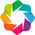

* Set Holoviews with bokeh.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
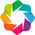

C:\Users\femtolab\.conda\envs\ePSdev\lib\site-packages\xyzpy\plot\xyz_cmaps.py:6: MatplotlibDeprecationWarning: 
The revcmap function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use Colormap.reversed() instead.
  return LinearSegmentedColormap(name, cm.revcmap(cmap._segmentdata))


Read data from d:\code\github\pemtk\demos\fitting\dataDump_1000fitTests_multiFit_noise_051021.pickle with pickle.


In [2]:
# Import & set paths
import pemtk
from pemtk.fit.fitClass import pemtkFit

from pathlib import Path

# Path for demo script
demoPath = Path(pemtk.__file__).parent.parent/Path('demos','fitting')

# Load sample dataset
dataPath = demoPath

# Basic test data - simulated results with no noise, 100 fits
# dataFile = 'dataDump_100fitTests_10t_randPhase_130621.pickle'

# Noisey test data - simulated results with noise, 1000 fits
dataFile = 'dataDump_1000fitTests_multiFit_noise_051021.pickle'   # Full class Pickle
# dataFile = 'dataDump_130722_12-21-17.pdHDF'  # Pandas hdf version

# 13/07/22 - with updated IO routines
data = pemtkFit()
data.loadFitData(dataFile,dataPath)

### Additional figure handling options

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
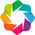

* Set Holoviews with bokeh.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
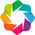

* Set Holoviews with bokeh.


In [3]:
# Some additional default plot settings
# TODO: this is already run at class init, but out of notebook scope? Should fix.
import epsproc as ep  # For some low-level routines
from epsproc.plot import hvPlotters  # Additional plotting code
hvPlotters.setPlotters(snsStyle='white')
# hvPlotters.sns.set_style("white")  # No grid case (for maps)
hv = hvPlotters.hv  # Set usual alias



# General size & range unless overridden
figSize = [700,300]
tRange = [3.8, 5.2]  # Set for axis slice, also for cmapping lims

# Update defaults
hvPlotters.setPlotters(width = figSize[0], height = figSize[1], snsStyle = 'white')

# Turn off Bokeh warnings
import warnings
# warnings.filterwarnings("ignore", message="when aspect and width/height is set, the bokeh backend")
warnings.simplefilter('ignore')

In [4]:
# Pandas table display settings
import pandas as pd
# pd.options.display.precision = 5
pd.options.display.float_format = '{:.3f}'.format

In [5]:
# Optional Matplotlib & set timeString (or will be set by hvSave in most cases)
# import matplotlib.pyplot as plt
# from datetime import datetime as dt
# timeString = dt.now()

## Preprocessing

In [6]:
# Run basic stats
data.analyseFits()

Pandas reference table not set, missing self.params data.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
{ 'Fits': 1000,
  'Minima': {'chisqr': 0.04215746268613921, 'redchi': 0.00022911664503336526},
  'Success': 992}


### Data conversion & export

Convert Pickled class data > more robust formats for distribution!

Note - this is aggregate data or specific fit data only (saves Pandas Dataframes or Xarray currently), but should be sufficient to recover results if Pickle file IO breaks.

In [7]:
# Write single key:value pairs
# data.writeFitData(outStem = 'dataDump_1000fitTests_multiFit_noise_051021', fType='pdHDF')

In [8]:
# Write agg datasets.
if exportData:
    data.processedToHDF5(dataPath = dataPath, outStem = 'dataDump_1000fitTests_multiFit_noise_051021', timeStamp=False)

Also export current env for transparency

In [9]:
condaEnv = 'epsdev'

In [10]:
!conda run -n {condaEnv} conda env export --no-builds > {Path(dataPath,'epsdev_051021.yml').as_posix()}

C:\Users\femtolab\AppData\Roaming\Python\Python37\site-packages\requests\__init__.py:91: RequestsDependencyWarning: urllib3 (1.25.8) or chardet (3.0.4) doesn't match a supported version!

  RequestsDependencyWarning)

C:\Users\femtolab\AppData\Roaming\Python\Python37\site-packages\requests\__init__.py:91: RequestsDependencyWarning: urllib3 (1.25.8) or chardet (3.0.4) doesn't match a supported version!

  RequestsDependencyWarning)




In [11]:
!conda run -n {condaEnv} pip list --format=freeze > {Path(dataPath,'epsdev_051021_requirements.txt').as_posix()}

In [12]:
# Set for fig saving
data.job['fileIn'] = Path(dataFile)
data.job['fileBase'] = Path(data.job['fileBase'], 'figs_290722')


## Input data and alignment plots

Plot ADMs and $\beta_{LM}$ inputs to fit, then stack to multi-panel plot.

In [13]:
# For ADMs

# Bespoke handling, see https://epsproc.readthedocs.io/en/dev/tests/hvPlotters_fn_tests_150720_v250122.html#curvePlot()-for-general-Holoviews-plotting

key = 'subset'
dataType='ADM'

daPlot = ep.matEleSelector(data.data[key][dataType], thres=1e-2, dims = 't', sq = True).squeeze()
daPlot = ep.plotTypeSelector(daPlot, pType = 'r')

from holoviews import opts, dim

# Plot with widgets to handle dims - note this may require .unstack() for multindex objects
hvObj = hvPlotters.curvePlot(daPlot.rename(r'$\beta_{LM}$').unstack(), kdims='t', renderPlot=False).opts(line_dash='dashed') 
hvObjP = hvObj * daPlot.rename(r'$\beta_{LM}$').unstack().hvplot.scatter(x='t', marker = 'x', size = 100)  # Add points


key = 'ADM'
dataType='ADM'

daPlot = ep.matEleSelector(data.data[key][dataType], thres=1e-2, dims = 't', sq = True).squeeze()
daPlot = ep.plotTypeSelector(daPlot, pType = 'r')

# Plot with widgets to handle dims - note this may require .unstack() for multindex objects
hvObj2 = hvPlotters.curvePlot(daPlot.rename(r'$\beta_{LM}$').unstack(), kdims='t', renderPlot=False)

# Overlay plot
hvADMPlot = (hvObjP * hvObj2).overlay(['K','Q','S'])


In [14]:
# Add BLMs...

key = 'subset'
dataType='AFBLM'

# blmLabel = r'$\beta_{LM}$'  # Doens't work in Bokeh, unless v>2.4, see https://github.com/bokeh/bokeh/issues/6031
blmLabel = 'βlm (unnorm)'  # No latex

daPlot = ep.matEleSelector(data.data[key][dataType], thres=1e-2, dims = 't', sq = True).squeeze()
daPlot = ep.plotTypeSelector(daPlot, pType = 'r')

from holoviews import opts, dim

# Plot with widgets to handle dims - note this may require .unstack() for multindex objects
hvObj = hvPlotters.curvePlot(daPlot.rename(blmLabel).unstack(), kdims='t', renderPlot=False).opts(line_dash='dashed') 
hvObjP = hvObj * daPlot.rename(blmLabel).unstack().hvplot.scatter(x='t', marker = 'x', size = 100)  # Add points


key = 'sim'
# dataType='ADM'

daPlot = ep.matEleSelector(data.data[key][dataType], thres=1e-2, dims = 't', sq = True).squeeze()
daPlot = ep.plotTypeSelector(daPlot, pType = 'r')

# Plot with widgets to handle dims - note this may require .unstack() for multindex objects
hvObj2 = hvPlotters.curvePlot(daPlot.rename(blmLabel).unstack(), kdims='t', renderPlot=False)

hvBLMPlot = (hvObjP * hvObj2).overlay(['l','m'])


Using default sph betas.
Plotting from self.data[ADM][ADM], facetDims=['Labels', 't'], pType=r with backend=mpl.
Grid plot: ADMs, dataType: ADM, plotType: r
Set plot to self.data['ADM']['plots']['ADM']['grid']


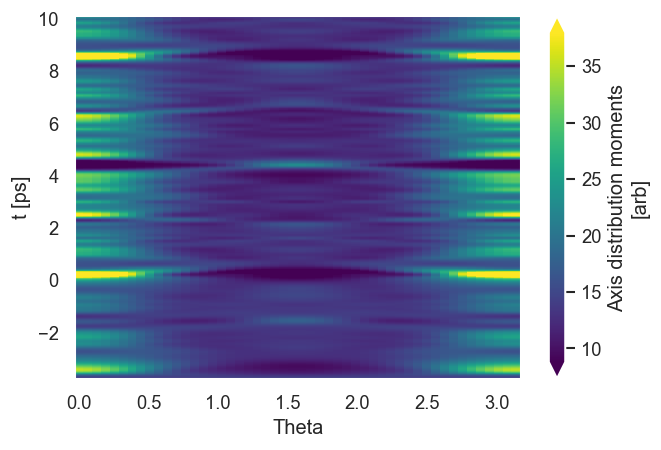

In [15]:
# Expand ADMs to P(theta)
data.data['ADM']['ADM'].attrs['jobLabel'] = 'ADMs'

# Old version
# ADMdistFull = data.padPlot(keys = 'ADM', dataType='ADM', Etype = 't', pType='r', pStyle='grid', reducePhi='sum', returnFlag = True, sumDims = {})

# Updated 23/04/22
data.padPlot(keys = 'ADM', dataType='ADM', Etype = 't', pType='r', pStyle='grid', reducePhi='sum', returnFlag = True, sumDims = {})
ADMdistFull = data.data['ADM']['plots']['ADM']['pData']

Using default sph betas.
Plotting from self.data[sim][AFBLM], facetDims=['Labels', 't'], pType=r with backend=mpl.
Grid plot: 3sg-1, dataType: AFBLM, plotType: r
Set plot to self.data['sim']['plots']['AFBLM']['grid']


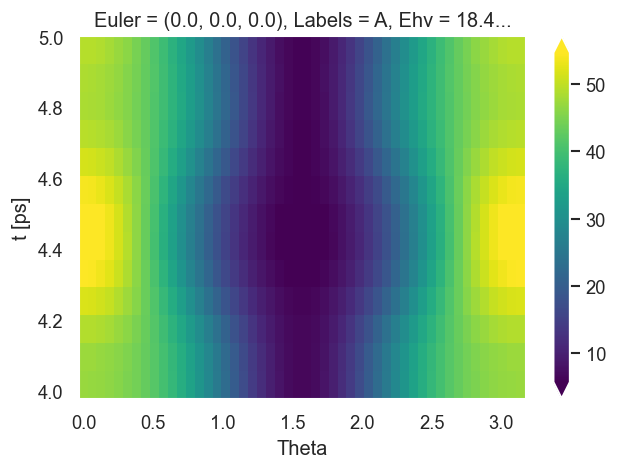

In [16]:
# Expand BLMs to I(theta)

key = 'sim'
dataType = 'AFBLM'
# data.data[key][dataType].attrs['jobLabel'] = 'ADMs'
# Old version
# It = data.padPlot(keys = key, dataType=dataType, Etype = 't', pType='r', pStyle='grid', reducePhi='sum', returnFlag = True, sumDims = {}, selDims = {'Labels':'A'})

# Updated 23/04/22
data.padPlot(keys = key, dataType=dataType, Etype = 't', pType='r', pStyle='grid', reducePhi='sum', returnFlag = True, sumDims = {}, selDims = {'Labels':'A'})
It = data.data['sim']['plots']['AFBLM']['pData']

In [17]:
# 4up plot layout - ADMs & BLMs + theta,E maps

# Can't suppress warnings here?
# %%capture --no-stderr
# warnings.simplefilter('ignore')

# figSize = [700,300]
# tRange = [3.8, 5.2]  # Set for axis slice, also for cmapping lims

# hvPlotters.sns.set_style("white")  # No grid case (for maps) - Holoviews picking this up...?

ADMdistPlot = ADMdistFull.sel({'t':slice(tRange[0],tRange[1])})  # Subselect this dataset first, otherwise it's all output to file and it is ~12Mb (6.1Mb limit on Authorea)

layout2 = (hvADMPlot.opts(frame_width = figSize[0], frame_height = figSize[1], xaxis=None, ylim=(-0.4,1.1), title='(a) ADMs') + 
     (ADMdistPlot/ADMdistPlot.max()).rename('v').squeeze().hvplot.heatmap(x='t',y='Theta',ylabel='θ',C='v', xaxis=None, cmap='viridis', frame_width = figSize[0], frame_height = figSize[1], title=r'(b) P(θ,t)').redim.range(v=(0, 1.0)) +
     hvBLMPlot.opts(frame_width = figSize[0], frame_height = figSize[1], xaxis=None, title=r'(c) βlm(t)') + 
     (It/It.max()).rename('v').squeeze().hvplot.heatmap(x='t',y='Theta',ylabel='θ',C='v', cmap='viridis', frame_width = figSize[0], frame_height = figSize[1], title=r'(d) I(θ,t)')).redim(t=hv.Dimension('t', range=(tRange[0], tRange[1]))).cols(1)

pType = 'data4up'

data.data['plots'] = {}  # Init plots dict
data.data['plots'][pType] = layout2

if saveFigs:
    data.hvSave(pTypes = pType)

# Show plot
layout2

Saving self.data[plots][data4up] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_data4up_290722_11-25-39.png


Saving self.data[plots][data4up] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_data4up_290722_11-25-50.html


:Layout
   .NdOverlay.I  :NdOverlay   [K,Q,S]
      :Overlay
         .Curve.I   :Curve   [t]   ($\beta_{LM}$)
         .Scatter.I :Scatter   [t]   ($\beta_{LM}$)
         .Curve.II  :Curve   [t]   ($\beta_{LM}$)
   .HeatMap.I    :HeatMap   [t,Theta]   (v)
   .NdOverlay.II :NdOverlay   [l,m]
      :Overlay
         .Curve.I   :Curve   [t]   (βlm (unnorm))
         .Scatter.I :Scatter   [t]   (βlm (unnorm))
         .Curve.II  :Curve   [t]   (βlm (unnorm))
   .HeatMap.II   :HeatMap   [t,Theta]   (v)

## Classifiers & best fits

### Fitting histogram

In [18]:
# With threshold set & fine binning.
# See fitHist() docs for more options.
data.fitHist(thres = 2.4e-4, bins = 100)

# data.fitHist(bins=20, binRange = [2.3e-4, 2.4e-4])   # Example with a range set

Mask selected 562 results (from 1000).


:AdjointLayout
   :Scatter   [redchi]   (Fit)
   :Histogram   [Fit]   (Fit_count)
   :Histogram   [redchi]   (redchi_count)

In [20]:
if saveFigs:
    data.hvSave(pTypes = 'fitHistPlot')   # , outStem = 'test')


Saving self.data[plots][fitHistPlot] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_fitHistPlot_290722_11-26-28.png
Saving self.data[plots][fitHistPlot] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_fitHistPlot_290722_11-26-30.html


### Rebin data by reduced $\chi^2$ (small range)

success                    chisqr                      redchi  \
              count unique   top freq   count  unique   top  freq   count   
redchiGroup                                                                 
A                 0      0   NaN  NaN       0       0   NaN   NaN       0   
B                 0      0   NaN  NaN       0       0   NaN   NaN       0   
C                 0      0   NaN  NaN       0       0   NaN   NaN       0   
D                 0      0   NaN  NaN       0       0   NaN   NaN       0   
E               350      1  True  350 350.000 350.000 0.042 1.000 350.000   
F                 0      0   NaN  NaN       0       0   NaN   NaN       0   
G                27      1  True   27  27.000  27.000 0.043 1.000  27.000   
H                43      1  True   43  43.000  43.000 0.043 1.000  43.000   
I                24      1  True   24  24.000  24.000 0.043 1.000  24.000   
J                 0      0   NaN  NaN       0       0   NaN   NaN       0   
K                11      1  True   11  11.000  11.000 0.043 1.000  11.000   
L                27      1  True   27  27.000  27.000 0.043 1.000  27.000   
M                 3      2  True    2   3.000   3.000 0.043 1.000   3.000   
N                54      1  True   54  54.000  54.000 0.043 1.000  54.000   
O                 5      1  True    5   5.000   5.000 0.044 1.000   5.000   
P                 0      0   NaN  NaN       0       0   NaN   NaN       0   
Q                15      2  True   14  15.000  15.000 0.044 1.000  15.000   
R                 3      1  True    3   3.000   3.000 0.044 1.000   3.000   
S                 0      0   NaN  NaN       0       0   NaN   NaN       0   

                                 
             unique   top  freq  
redchiGroup                      
A                 0   NaN   NaN  
B                 0   NaN   NaN  
C                 0   NaN   NaN  
D                 0   NaN   NaN  
E           350.000 0.000 1.000  
F                 0   NaN   NaN  
G            27.000 0.000 1.000  
H            43.000 0.000 1.000  
I            24.000 0.000 1.000  
J                 0   NaN   NaN  
K            11.000 0.000 1.000  
L            27.000 0.000 1.000  
M             3.000 0.000 1.000  
N            54.000 0.000 1.000  
O             5.000 0.000 1.000  
P                 0   NaN   NaN  
Q            15.000 0.000 1.000  
R             3.000 0.000 1.000  
S                 0   NaN   NaN

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


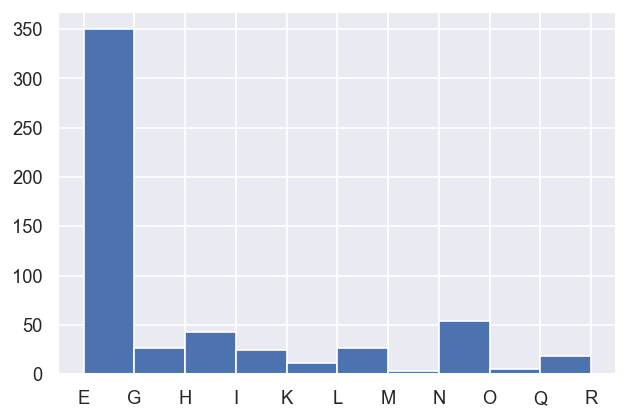

In [21]:
# Again, more control can be obtained by specifiying the desired binning.
data.classifyFits(bins = [2.26e-4, 2.4e-4,20])

In [22]:
data.setMatEFit()  # In current dataset data.lmmu not present initially? Run this to generate
# data.data['plots']['paramData'].replace({'Param':data.lmmu['lmMap']})

Set 6 complex matrix elements to 12 fitting params, see self.params for details.
Auto-setting parameters.


name,value,initial value,min,max,vary,expression
m_PU_SG_PU_1_n1_1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,True,
m_PU_SG_PU_1_1_n1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,False,m_PU_SG_PU_1_n1_1_1
m_PU_SG_PU_3_n1_1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,True,
m_PU_SG_PU_3_1_n1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,False,m_PU_SG_PU_3_n1_1_1
m_SU_SG_SU_1_0_0_1,2.68606212,2.686062120382649,1.0000e-04,5.00000000,True,
m_SU_SG_SU_3_0_0_1,1.10915311,1.109153108617096,1.0000e-04,5.00000000,True,
p_PU_SG_PU_1_n1_1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,
p_PU_SG_PU_1_1_n1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,p_PU_SG_PU_1_n1_1_1
p_PU_SG_PU_3_n1_1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,True,
p_PU_SG_PU_3_1_n1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,False,p_PU_SG_PU_3_n1_1_1


In [23]:
# Plot params violin style

# data.paramPlot(dataType='m', sel = 'E', hue = 'redchi', backend='hv', hvType='violin', returnFlag = True, remap = 'lmMap')
data.paramPlot(selectors={'Type':'m', 'redchiGroup':'E'}, hue = 'redchi', backend='hv', hvType='violin', returnFlag = True, remap = 'lmMap')
mParams = data.data['plots']['paramPlot']
data.paramPlot(selectors={'Type':'p', 'redchiGroup':'E'}, hue = 'redchi', backend='hv', hvType='violin', returnFlag = True, remap = 'lmMap')
pParams = data.data['plots']['paramPlot']

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

In [24]:
# Replot as 2-up layout

# Setting shared_axes=False works, although also looses link over x-axis.
# Need to rename dims? See https://github.com/holoviz/holoviews/issues/714
# E.g. mParams.redim(y={'name','Mag'})  # Works for label, but not underlying plots
layout3 = (mParams.redim(Mag=hv.Dimension('Mag', range=(1, 3))).opts(frame_width = figSize[0], frame_height = figSize[1], xaxis=None, ylabel='Mag', ylim=(1.0,3.0), title='(a) Magnitudes') + 
     pParams.opts(frame_width = figSize[0], frame_height = figSize[1], ylabel='Phase', title='(b) Phases')).opts(shared_axes=False).cols(1)


pType = 'paramsViolin'
data.data['plots'][pType] = layout3

if saveFigs:
    data.hvSave(pTypes = pType)

# Show plot
layout3


Saving self.data[plots][paramsViolin] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_paramsViolin_290722_11-26-33.png
Saving self.data[plots][paramsViolin] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_paramsViolin_290722_11-26-35.html


:Layout
   .Overlay.I  :Overlay
      .Violin.I  :Violin   [Param]   (value)
      .Scatter.I :Scatter   [Param]   (value,redchi)
   .Overlay.II :Overlay
      .Violin.I  :Violin   [Param]   (value)
      .Scatter.I :Scatter   [Param]   (value,redchi)

### Rebin over further reduced range - Correlation plot & $\beta_{LM}$ plots

success                    chisqr                      redchi  \
              count unique   top freq   count  unique   top  freq   count   
redchiGroup                                                                 
A                 0      0   NaN  NaN       0       0   NaN   NaN       0   
B                 0      0   NaN  NaN       0       0   NaN   NaN       0   
C               204      1  True  204 204.000 204.000 0.042 1.000 204.000   
D                 0      0   NaN  NaN       0       0   NaN   NaN       0   
E                44      1  True   44  44.000  44.000 0.042 1.000  44.000   
F                 0      0   NaN  NaN       0       0   NaN   NaN       0   
G                55      1  True   55  55.000  55.000 0.042 1.000  55.000   
H                 0      0   NaN  NaN       0       0   NaN   NaN       0   
I                 0      0   NaN  NaN       0       0   NaN   NaN       0   
J                 0      0   NaN  NaN       0       0   NaN   NaN       0   
K                47      1  True   47  47.000  47.000 0.042 1.000  47.000   
L                 0      0   NaN  NaN       0       0   NaN   NaN       0   
M                 0      0   NaN  NaN       0       0   NaN   NaN       0   
N                 0      0   NaN  NaN       0       0   NaN   NaN       0   
O                 0      0   NaN  NaN       0       0   NaN   NaN       0   
P                 0      0   NaN  NaN       0       0   NaN   NaN       0   
Q                 0      0   NaN  NaN       0       0   NaN   NaN       0   
R                 0      0   NaN  NaN       0       0   NaN   NaN       0   
S                 0      0   NaN  NaN       0       0   NaN   NaN       0   

                                 
             unique   top  freq  
redchiGroup                      
A                 0   NaN   NaN  
B                 0   NaN   NaN  
C           204.000 0.000 1.000  
D                 0   NaN   NaN  
E            44.000 0.000 1.000  
F                 0   NaN   NaN  
G            55.000 0.000 1.000  
H                 0   NaN   NaN  
I                 0   NaN   NaN  
J                 0   NaN   NaN  
K            47.000 0.000 1.000  
L                 0   NaN   NaN  
M                 0   NaN   NaN  
N                 0   NaN   NaN  
O                 0   NaN   NaN  
P                 0   NaN   NaN  
Q                 0   NaN   NaN  
R                 0   NaN   NaN  
S                 0   NaN   NaN

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


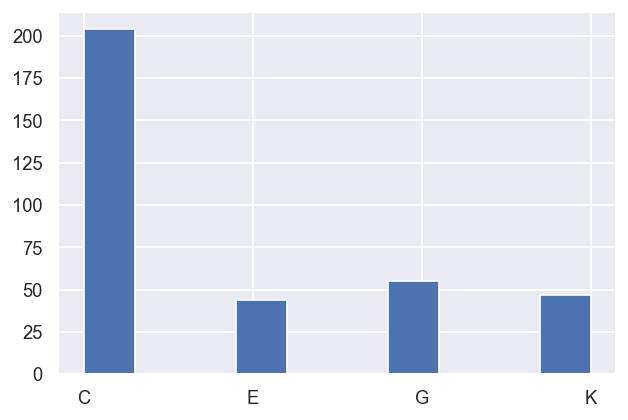

In [25]:
# Set new classifiers for small range
data.classifyFits(bins = [2.29e-4, 2.3e-4,20])

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param                 PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type redchiGroup                                                            
2   m    C                        1.610              1.618              1.141   
    n    C                        0.400              0.402              0.284   
    p    C                       -0.857             -0.861              1.199   
    pc   C                        0.000              0.004              2.056   
8   m    G                        1.569              1.655              1.167   
...                                 ...                ...                ...   
997 pc   C                        0.000              0.002              2.059   
999 m    C                        1.610              1.617              1.141   
    n    C                        0.400              0.402              0.284   
    p    C                       -0.856             -0.861              1.200   
    pc   C                        0.000              0.005              2.056   

Param                 PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type redchiGroup                                                         
2   m    C                        1.144             2.653             1.144  
    n    C                        0.284             0.660             0.285  
    p    C                        1.200             2.437            -0.704  
    pc   C                        2.057             2.989             0.153  
8   m    G                        1.207             2.660             1.130  
...                                 ...               ...               ...  
997 pc   C                        2.061             2.986             0.155  
999 m    C                        1.144             2.653             1.144  
    n    C                        0.285             0.660             0.285  
    p    C                        1.200             2.438            -0.704  
    pc   C                        2.056             2.990             0.152  

[1400 rows x 6 columns]

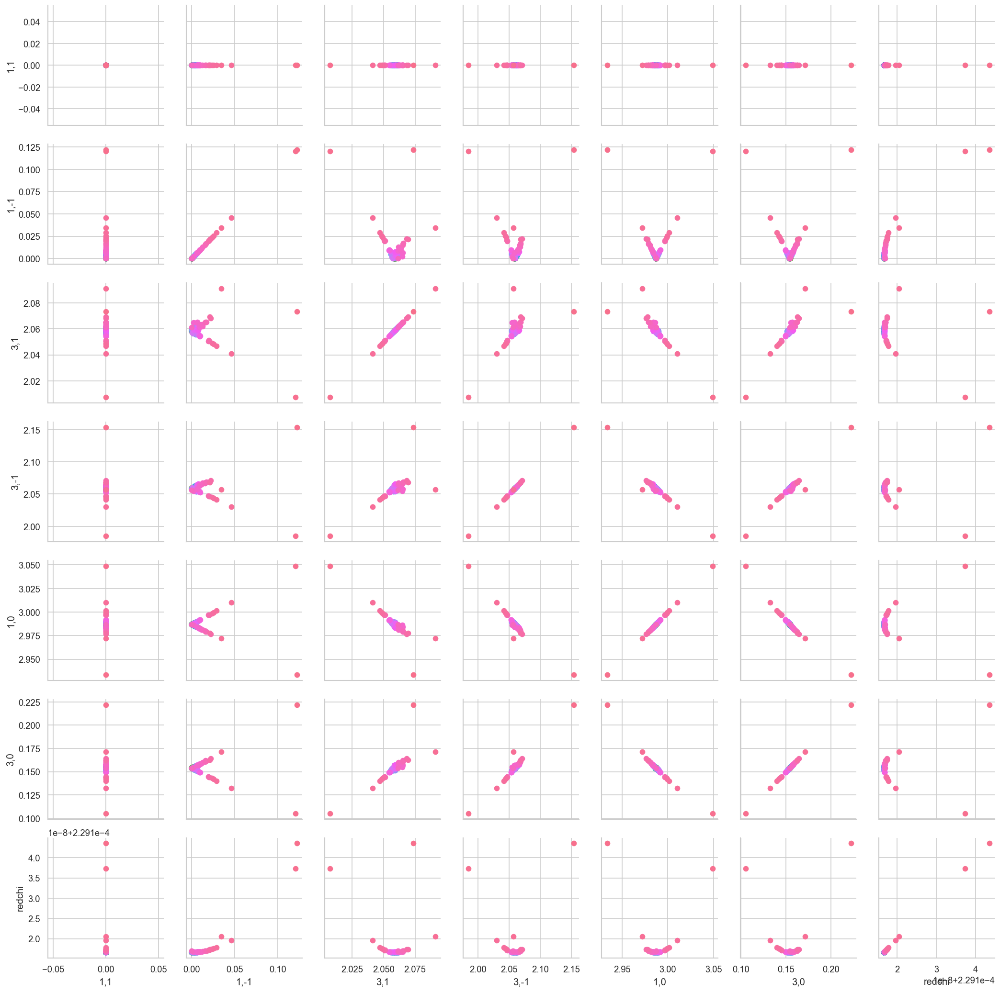

In [26]:
# corrPlot() with subselections (two levels)
# NOTE: with hue mapping for a continuous range this can be quite slow (minutes).

# Additional style forcing... not picking up globals here?
hvPlotters.sns.set_style("whitegrid")  # OK

# no phase corr
# data.corrPlot(dataType = 'C', level = 'redchiGroup', sel = 'p', selLevel = 'Type', hue = 'redchi')

# With phase corr
data.phaseCorrection(absFlag=True,useRef=False)  # NOTE - need to rerun phaseCorrection after classification
# data.phaseCorrection(useRef=False)  # Ref to self. (Defaults to input matrix elements)
# data.paramPlot(dataType='pc', sel = 'C', hue = 'redchi', backend='hv', hRound = 9)
# data.corrPlot(dataType = 'C', level = 'redchiGroup', sel = 'pc', selLevel = 'Type', hue = 'redchi')   # Check pair correlations including redchi 

data.corrPlot(dataType = 'C', level = 'redchiGroup', sel = 'pc', selLevel = 'Type', hue = 'redchi', remap = 'lmMap')  #, alpha = 0.3)

#                 plot_kws={'alpha': 0.1}) # Additional args for Seaborn PairGrid, see https://stackoverflow.com/questions/47200033/how-to-adjust-transparency-alpha-in-seaborn-pairplot
#                  plot_kws={'scatter_kws': {'alpha': 0.1}}) # Additional args 

# data.corrPlot(dataType = 'C', level = 'redchiGroup', sel = 'pc', selLevel = 'Type', hue = 'Fit')   # Check pair correlations including Fit #

if saveFigs:
#     plt.title('')
#     plt.ylabel(r'$\beta_{L,M}$')
    import matplotlib.pyplot as plt
    from datetime import datetime as dt
    timeString = dt.now()
    plt.savefig(f'{data.job["fileIn"].stem}_corrPlot_{timeString.strftime("%d%m%y")}.png')

In [27]:
# Get parameter statistics.
# Specify subselection criteria with a dictionary of selectors (currently uses index values only)
# TODO: more general selection & groupings here.
data.paramsReport(inds = {'redchiGroup':'C'})

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set parameter stats to self.paramsSummary.


Type                         m     n      p    pc
Param             Agg                            
PU_SG_PU_1_1_n1_1 min    1.605 0.399 -0.883 0.000
                  mean   1.614 0.401 -0.859 0.000
                  median 1.614 0.401 -0.861 0.000
                  max    1.626 0.404 -0.739 0.000
                  std    0.002 0.001  0.014 0.000
                  var    0.000 0.000  0.000 0.000
PU_SG_PU_1_n1_1_1 min    1.602 0.398 -0.861 0.000
                  mean   1.614 0.401 -0.861 0.005
                  median 1.614 0.401 -0.861 0.002
                  max    1.628 0.404 -0.861 0.122
                  std    0.002 0.001  0.000 0.013
                  var    0.000 0.000  0.000 0.000
PU_SG_PU_3_1_n1_1 min    1.124 0.279 -2.931 2.007
                  mean   1.143 0.284  0.149 2.059
                  median 1.143 0.284  1.197 2.059
                  max    1.174 0.292  1.266 2.091
                  std    0.003 0.001  1.798 0.005
                  var    0.000 0.000  3.232 0.000
PU_SG_PU_3_n1_1_1 min    1.124 0.279 -2.928 1.985
                  mean   1.142 0.284  0.149 2.059
                  median 1.142 0.284  1.197 2.059
                  max    1.173 0.291  1.244 2.154
                  std    0.003 0.001  1.798 0.009
                  var    0.000 0.000  3.234 0.000
SU_SG_SU_1_0_0_1  min    2.652 0.659  2.116 2.934
                  mean   2.653 0.660  2.357 2.987
                  median 2.653 0.660  2.434 2.987
                  max    2.653 0.660  2.493 3.049
                  std    0.000 0.000  0.134 0.007
                  var    0.000 0.000  0.018 0.000
SU_SG_SU_3_0_0_1  min    1.143 0.284 -1.026 0.105
                  mean   1.144 0.285 -0.785 0.154
                  median 1.144 0.285 -0.708 0.154
                  max    1.144 0.285 -0.636 0.222
                  std    0.000 0.000  0.134 0.007
                  var    0.000 0.000  0.018 0.000

In [28]:
# The default routine aggreagates over all fits (mean + std for spread) and stacks plots
# Set xDim to ensure consistent plotting
data.BLMsetPlot(xDim = 't')

:Overlay
   .NdOverlay.I  :NdOverlay   [l,m]
      :Spread   [t]   (BLM,BLM_std)
   .NdOverlay.II :NdOverlay   [l,m]
      :Overlay
         .Curve.I   :Curve   [t]   (BLM-ref)
         .Scatter.I :Scatter   [t]   (BLM-ref)

In [29]:
# Replot + input data
figSize = [700,600]

layout = (hvBLMPlot * data.data['plots']['BLMsetPlot']).opts(frame_width = figSize[0], frame_height = figSize[1], xaxis=True)

# hvPlotters.hv.save(layout3, f'{fName.stem}_BLM_allFits_150422', fmt='html')
# hvPlotters.hv.save(layout3, f'{fName.stem}_BLM_allFits_150422', fmt='png')

pType = 'BLMdataAgg'
data.data['plots'][pType] = layout

if saveFigs:
    data.hvSave(pTypes = pType)
    
layout

Saving self.data[plots][BLMdataAgg] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_BLMdataAgg_290722_11-29-50.png
Saving self.data[plots][BLMdataAgg] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_BLMdataAgg_290722_11-29-53.html


:Overlay
   .NdOverlay.I   :NdOverlay   [l,m]
      :Overlay
         .Curve.I   :Curve   [t]   (βlm (unnorm))
         .Scatter.I :Scatter   [t]   (βlm (unnorm))
         .Curve.II  :Curve   [t]   (βlm (unnorm))
   .NdOverlay.II  :NdOverlay   [l,m]
      :Spread   [t]   (BLM,BLM_std)
   .NdOverlay.III :NdOverlay   [l,m]
      :Overlay
         .Curve.I   :Curve   [t]   (BLM-ref)
         .Scatter.I :Scatter   [t]   (BLM-ref)

## Tables

### Final parameters

success                    chisqr                      redchi  \
              count unique   top freq   count  unique   top  freq   count   
redchiGroup                                                                 
A                 0      0   NaN  NaN       0       0   NaN   NaN       0   
B                 0      0   NaN  NaN       0       0   NaN   NaN       0   
C               204      1  True  204 204.000 204.000 0.042 1.000 204.000   
D                 0      0   NaN  NaN       0       0   NaN   NaN       0   
E                44      1  True   44  44.000  44.000 0.042 1.000  44.000   
F                 0      0   NaN  NaN       0       0   NaN   NaN       0   
G                55      1  True   55  55.000  55.000 0.042 1.000  55.000   
H                 0      0   NaN  NaN       0       0   NaN   NaN       0   
I                 0      0   NaN  NaN       0       0   NaN   NaN       0   
J                 0      0   NaN  NaN       0       0   NaN   NaN       0   
K                47      1  True   47  47.000  47.000 0.042 1.000  47.000   
L                 0      0   NaN  NaN       0       0   NaN   NaN       0   
M                 0      0   NaN  NaN       0       0   NaN   NaN       0   
N                 0      0   NaN  NaN       0       0   NaN   NaN       0   
O                 0      0   NaN  NaN       0       0   NaN   NaN       0   
P                 0      0   NaN  NaN       0       0   NaN   NaN       0   
Q                 0      0   NaN  NaN       0       0   NaN   NaN       0   
R                 0      0   NaN  NaN       0       0   NaN   NaN       0   
S                 0      0   NaN  NaN       0       0   NaN   NaN       0   

                                 
             unique   top  freq  
redchiGroup                      
A                 0   NaN   NaN  
B                 0   NaN   NaN  
C           204.000 0.000 1.000  
D                 0   NaN   NaN  
E            44.000 0.000 1.000  
F                 0   NaN   NaN  
G            55.000 0.000 1.000  
H                 0   NaN   NaN  
I                 0   NaN   NaN  
J                 0   NaN   NaN  
K            47.000 0.000 1.000  
L                 0   NaN   NaN  
M                 0   NaN   NaN  
N                 0   NaN   NaN  
O                 0   NaN   NaN  
P                 0   NaN   NaN  
Q                 0   NaN   NaN  
R                 0   NaN   NaN  
S                 0   NaN   NaN

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param                 PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type redchiGroup                                                            
2   m    C                        1.610              1.618              1.141   
    n    C                        0.400              0.402              0.284   
    p    C                       -0.857             -0.861              1.199   
    pc   C                        0.000              0.004              2.056   
8   m    G                        1.569              1.655              1.167   
...                                 ...                ...                ...   
997 pc   C                        0.000              0.002              2.059   
999 m    C                        1.610              1.617              1.141   
    n    C                        0.400              0.402              0.284   
    p    C                       -0.856             -0.861              1.200   
    pc   C                        0.000              0.005              2.056   

Param                 PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type redchiGroup                                                         
2   m    C                        1.144             2.653             1.144  
    n    C                        0.284             0.660             0.285  
    p    C                        1.200             2.437            -0.704  
    pc   C                        2.057             2.989             0.153  
8   m    G                        1.207             2.660             1.130  
...                                 ...               ...               ...  
997 pc   C                        2.061             2.986             0.155  
999 m    C                        1.144             2.653             1.144  
    n    C                        0.285             0.660             0.285  
    p    C                        1.200             2.438            -0.704  
    pc   C                        2.056             2.990             0.152  

[1400 rows x 6 columns]

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set parameter stats to self.paramsSummary.


Type                         m     n      p    pc
Param             Agg                            
PU_SG_PU_1_1_n1_1 min    1.605 0.399 -0.883 0.000
                  mean   1.614 0.401 -0.859 0.000
                  median 1.614 0.401 -0.861 0.000
                  max    1.626 0.404 -0.739 0.000
                  std    0.002 0.001  0.014 0.000
                  var    0.000 0.000  0.000 0.000
PU_SG_PU_1_n1_1_1 min    1.602 0.398 -0.861 0.000
                  mean   1.614 0.401 -0.861 0.005
                  median 1.614 0.401 -0.861 0.002
                  max    1.628 0.404 -0.861 0.122
                  std    0.002 0.001  0.000 0.013
                  var    0.000 0.000  0.000 0.000
PU_SG_PU_3_1_n1_1 min    1.124 0.279 -2.931 2.007
                  mean   1.143 0.284  0.149 2.059
                  median 1.143 0.284  1.197 2.059
                  max    1.174 0.292  1.266 2.091
                  std    0.003 0.001  1.798 0.005
                  var    0.000 0.000  3.232 0.000
PU_SG_PU_3_n1_1_1 min    1.124 0.279 -2.928 1.985
                  mean   1.142 0.284  0.149 2.059
                  median 1.142 0.284  1.197 2.059
                  max    1.173 0.291  1.244 2.154
                  std    0.003 0.001  1.798 0.009
                  var    0.000 0.000  3.234 0.000
SU_SG_SU_1_0_0_1  min    2.652 0.659  2.116 2.934
                  mean   2.653 0.660  2.357 2.987
                  median 2.653 0.660  2.434 2.987
                  max    2.653 0.660  2.493 3.049
                  std    0.000 0.000  0.134 0.007
                  var    0.000 0.000  0.018 0.000
SU_SG_SU_3_0_0_1  min    1.143 0.284 -1.026 0.105
                  mean   1.144 0.285 -0.785 0.154
                  median 1.144 0.285 -0.708 0.154
                  max    1.144 0.285 -0.636 0.222
                  std    0.000 0.000  0.134 0.007
                  var    0.000 0.000  0.018 0.000

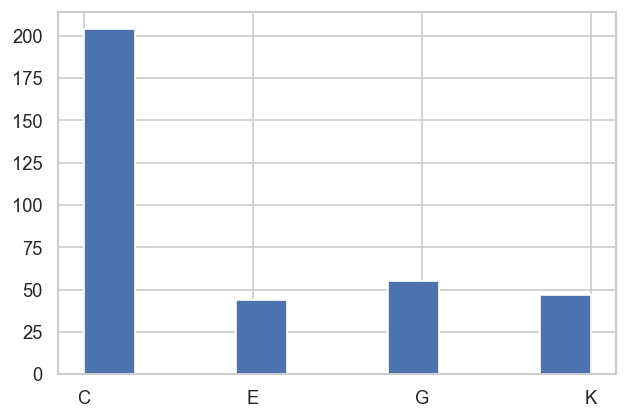

In [30]:
# Note - may need to rerun classifier here to ensure correct dataset if messed about with above!

data.classifyFits(bins = [2.29e-4, 2.3e-4,20])  # Rerun classifier to clean-up
data.phaseCorrection(absFlag=True, useRef = False)
data.paramsReport(inds = {'redchiGroup':'C'})

In [31]:
# With abs phaseCorrection flag set
import pandas as pd
# pd.options.display.precision = 5
pd.options.display.float_format = '{:.3f}'.format

data.paramsCompare(phaseCorrParams={'absFlag':True, 'useRef':False})


*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param     PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type                                                            
ref m                 1.785              1.785              0.803   
    n                 0.445              0.445              0.200   
    p                -0.861             -0.861             -3.120   
    pc                0.000              0.000              2.259   

Param     PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type                                                         
ref m                 0.803             2.686             1.109  
    n                 0.200             0.669             0.276  
    p                -3.120             2.611            -0.079  
    pc                2.259             2.811             0.782

Set parameter comparison to self.paramsSummaryComp.


Param                PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Type Source   dType                                                            
m    mean     num                1.614              1.614              1.143   
     ref      num                1.785              1.785              0.803   
     diff     %                 10.583             10.599             29.733   
              num               -0.171             -0.171              0.340   
     std      %                  0.130              0.137              0.266   
              num                0.002              0.002              0.003   
     diff/std %               8139.354           7726.095          11168.316   
n    mean     num                0.401              0.401              0.284   
     ref      num                0.445              0.445              0.200   
     diff     %                 10.784             10.801             29.604   
              num               -0.043             -0.043              0.084   
     std      %                  0.133              0.133              0.262   
              num                0.001              0.001              0.001   
     diff/std %               8123.972           8123.937          11298.199   
p    mean     num               -0.859             -0.861              0.149   
     ref      num               -0.861             -0.861             -3.120   
     diff     %                  0.195              0.000           2189.833   
              num                0.002              0.000              3.270   
     std      %                  1.632              0.000           1204.022   
              num                0.014              0.000              1.798   
     diff/std %                 11.953                inf            181.876   
pc   mean     num                0.000              0.005              2.059   
     ref      num                0.000              0.000              2.259   
     diff     %                    nan            100.000              9.741   
              num                0.000              0.005             -0.201   
     std      %                    nan            243.149              0.256   
              num                0.000              0.013              0.005   
     diff/std %                    nan             41.127           3798.755   

Param                PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Type Source   dType                                                         
m    mean     num                1.142             2.653             1.144  
     ref      num                0.803             2.686             1.109  
     diff     %                 29.715             1.264             3.030  
              num                0.339            -0.034             0.035  
     std      %                  0.265             0.002             0.007  
              num                0.003             0.000             0.000  
     diff/std %              11210.075         79267.770         44813.500  
n    mean     num                0.284             0.660             0.285  
     ref      num                0.200             0.669             0.276  
     diff     %                 29.587             1.449             2.853  
              num                0.084            -0.010             0.008  
     std      %                  0.264             0.014             0.018  
              num                0.001             0.000             0.000  
     diff/std %              11228.378         10459.719         15923.757  
p    mean     num                0.149             2.357            -0.785  
     ref      num               -3.120             2.611            -0.079  
     diff     %               2198.785            10.779            89.974  
              num                3.269            -0.254            -0.706  
     std      %               1209.452             5.699   

In [32]:
# Output table to latex
if saveTables:
    data.paramsSummaryComp.to_latex(f'paramsComp_latex_{timeString.strftime("%d%m%y")}.tex')

### Init & final relabelled

#### Aggregate results from best fits

In [33]:
data.setAggMatE(simpleForm = True)

Set reformatted aggregate data to self.data[agg][matEpd].


In [34]:
data.data['agg']['matEpd']

Type             m     n      p    pc          comp         compC labels
Cont l m  mu                                                            
PU   1 -1  1 1.614 0.401 -0.859 0.000  1.054-1.222j  0.401+0.000j   1,-1
        1 -1 1.614 0.401 -0.861 0.005  1.051-1.224j  0.401+0.002j    1,1
     3 -1  1 1.143 0.284  0.149 2.059  1.130+0.170j -0.133+0.251j   3,-1
        1 -1 1.142 0.284  0.149 2.059  1.130+0.169j -0.133+0.251j    3,1
SU   1  0  0 2.653 0.660  2.357 2.987 -1.877+1.874j -0.652+0.102j    1,0
     3  0  0 1.144 0.285 -0.785 0.154  0.809-0.808j  0.281+0.044j    3,0

In [35]:
if saveTables:
    data.data['agg']['matEpd'].to_latex(f'paramsAggRelabelled_latex_{timeString.strftime("%d%m%y")}.tex')

#### Input matrix elements

Use `setAggMatE` for consistent reformatting to table.

In [36]:
data.setAggMatE(key = 'ref', simpleForm = True) 
data.data['ref']['matEpd']

Set reformatted ref data to self.data[ref][matEpd].


comp     m      p labels
Cont l m  mu                                  
PU   1 -1  1  1.163-1.354j 1.785 -0.861   1,-1
        1 -1  1.163-1.354j 1.785 -0.861    1,1
     3 -1  1 -0.803-0.017j 0.803 -3.120   3,-1
        1 -1 -0.803-0.017j 0.803 -3.120    3,1
SU   1  0  0 -2.317+1.359j 2.686  2.611    1,0
     3  0  0  1.106-0.087j 1.109 -0.079    3,0

In [37]:
if saveTables:
    data.data['agg']['matEpd'].to_latex(f'paramsInputRelabelled_latex_{timeString.strftime("%d%m%y")}.tex')

### Comparison table relabelled

Update table with renamed params from list.

In [38]:
summaryRenamed = pemtk.fit._util.renameParams(data.paramsSummaryComp, data.lmmu['lmMap']) 
summaryRenamed

lm                       1,1     1,-1       3,1      3,-1       1,0       3,0
Type Source   dType                                                          
m    mean     num      1.614    1.614     1.143     1.142     2.653     1.144
     ref      num      1.785    1.785     0.803     0.803     2.686     1.109
     diff     %       10.583   10.599    29.733    29.715     1.264     3.030
              num     -0.171   -0.171     0.340     0.339    -0.034     0.035
     std      %        0.130    0.137     0.266     0.265     0.002     0.007
              num      0.002    0.002     0.003     0.003     0.000     0.000
     diff/std %     8139.354 7726.095 11168.316 11210.075 79267.770 44813.500
n    mean     num      0.401    0.401     0.284     0.284     0.660     0.285
     ref      num      0.445    0.445     0.200     0.200     0.669     0.276
     diff     %       10.784   10.801    29.604    29.587     1.449     2.853
              num     -0.043   -0.043     0.084     0.084    -0.010     0.008
     std      %        0.133    0.133     0.262     0.264     0.014     0.018
              num      0.001    0.001     0.001     0.001     0.000     0.000
     diff/std %     8123.972 8123.937 11298.199 11228.378 10459.719 15923.757
p    mean     num     -0.859   -0.861     0.149     0.149     2.357    -0.785
     ref      num     -0.861   -0.861    -3.120    -3.120     2.611    -0.079
     diff     %        0.195    0.000  2189.833  2198.785    10.779    89.974
              num      0.002    0.000     3.270     3.269    -0.254    -0.706
     std      %        1.632    0.000  1204.022  1209.452     5.699    17.083
              num      0.014    0.000     1.798     1.798     0.134     0.134
     diff/std %       11.953      inf   181.876   181.800   189.129   526.696
pc   mean     num      0.000    0.005     2.059     2.059     2.987     0.154
     ref      num      0.000    0.000     2.259     2.259     2.811     0.782
     diff     %          nan  100.000     9.741     9.738     5.893   407.161
              num      0.000    0.005    -0.201    -0.200     0.176    -0.628
     std      %          nan  243.149     0.256     0.460     0.226     4.424
              num      0.000    0.013     0.005     0.009     0.007     0.007
     diff/std %          nan   41.127  3798.755  2114.926  2605.648  9204.066

In [39]:
if saveTables:
    data.data['agg']['matEpd'].to_latex(f'paramsInputRelabelled_latex_{timeString.strftime("%d%m%y")}.tex')

### MFPAD plotting

**FINAL PLOTTING IN MFPAD_replotting_from_file_190722-dist.ipynb for tidy version**

UPDATES here for data handling and export only.

In [40]:
# Set Agg data to XR dataset, along with ref data set
data.aggToXR(refKey = 'orb5', returnType = 'ds', conformDims=True)  # OK
# data.aggToXR(refKey = 'orb5', returnType = 'ds', conformDims=False)  # If False, set to dict, otherwise fails at DS stacking
# data.aggToXR(refKey = 'orb5', returnType = 'da', conformDims=False)  # OK - sets to separate DAs. May want this for better dim handling - missing some sym dims in current example case.
# data.aggToXR(returnType = 'ds', conformDims=False)  # OK without refKey to stack with different dims.

Added dim Targ
Added dim Total
Added dim Targ
Added dim Total
Set XR dataset for self.data['agg']['matE']


In [41]:
data.data['agg']['matE'] 

<xarray.Dataset>
Dimensions:  (Eke: 51, LM: 18, Sym: 4, Type: 4, it: 1, mu: 3)
Coordinates:
  * Type     (Type) object 'L' 'V' 'comp' 'compC'
  * LM       (LM) MultiIndex
  - l        (LM) int64 1 1 1 3 3 3 5 5 5 7 7 7 9 9 9 11 11 11
  - m        (LM) int64 -1 0 1 -1 0 1 -1 0 1 -1 0 1 -1 0 1 -1 0 1
  * Sym      (Sym) MultiIndex
  - Cont     (Sym) object 'PU' 'PU' 'SU' 'SU'
  - Targ     (Sym) object 'SG' 'U' 'SG' 'U'
  - Total    (Sym) object 'PU' 'U' 'SU' 'U'
  * mu       (mu) int64 -1 0 1
    Ehv      (Eke) float64 17.4 18.4 19.4 20.4 21.4 ... 63.4 64.4 65.4 66.4 67.4
  * Eke      (Eke) float64 0.1 1.1 2.1 3.1 4.1 5.1 ... 46.1 47.1 48.1 49.1 50.1
  * it       (it) int64 1
    SF       (Eke) complex128 (2.1560627+3.741674j) ... (4.4127053+1.8281945j)
Data variables:
    comp     (Type, mu, LM, Sym) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)
    compC    (Type, mu, LM, Sym) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)
    orb5     (LM, Eke, Sym, mu, it, Type) complex128 (nan+nanj) ... (nan+nanj)

In [42]:
# Write data - quick way from dataset
from epsproc.util.listFuncs import dataTypesList
dType = 'matE'
refDims = dataTypesList()[dType]['def']

if exportData:
    dataSave = data.data['agg']['matE'].unstack(refDims(sType='sDict'))
    dataSave.to_netcdf('matE_fittingAgg_Ref_200722_DS_c.ncf', engine='h5netcdf', invalid_netcdf=True)  # OK IF READ IN WITH SAME ENGINE ONLY!

In [43]:
# Write data with function + wrapper - TODO

## Density matrix plotting

Adapted from https://epsproc.readthedocs.io/en/dev/methods/density_mat_notes_demo_300821.html

In [44]:
import numpy as np

def unsignedPhase(da):
    """Convert to unsigned phases."""
    # Set mag, phase
    mag = da.pipe(np.abs)
    phase = da.pipe(np.angle)  # Returns np array only!
    
    # Set unsigned
    magUS = mag.pipe(np.abs)
#     phaseUS = phase.pipe(np.abs)  
    phaseUS = np.abs(phase)
    
    # Set complex
    compFixed = magUS * np.exp(1j* phaseUS)
#     return mag,phase
    return compFixed

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
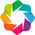

Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.
Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.
Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.


:Layout
   .NdLayout.Left_parenthesis_a_right_parenthesis_Reference_density_matrix_left_parenthesis_unsigned_phases_right_parenthesis :NdLayout   [Component]
      :HeatMap   [l,m,mu,l,m,mu_p]   (n2_3sg_0.1-50.1eV_A2.inp.out)
   .NdLayout.Left_parenthesis_b_right_parenthesis_Reconstructed                                                               :NdLayout   [pType]
      :HeatMap   [l,m,mu,l,m,mu_p]   (compC)
   .NdLayout.Left_parenthesis_c_right_parenthesis_Difference                                                                  :NdLayout   [pType]
      :HeatMap   [l,m,mu,l,m,mu_p]   (Difference)

In [45]:
# v2 - as v1, but differences for unsigned phase case & fix labels
# 26/07/22: messy but working. Some labelling tricks to push back into matPlot() routine

# Import routines
from epsproc.calc import density


# Compose density matrix

# Set dimensions/state vector/representation
# These must be in original data, but will be restacked as necessary to define the effective basis space.
denDims = ['LM', 'mu']
selDims = {'Type':'L'}
pTypes=['r','i']
thres = 1e-2    # 0.2 # Threshold out l>3 terms if using full 'orb5' set.
normME = False
normDen = 'max'
usPhase = True # Use unsigned phases?

# Calculate - Ref case
# matE = data.data['subset']['matE']
# Set data from master class
# k = 'orb5'  # N2 orb5 (SG) dataset
k = 'subset'
matE = data.data[k]['matE']
if normME:
    matE = matE/matE.max()

if usPhase:
    matE = unsignedPhase(matE)
    
daOut, *_ = density.densityCalc(matE, denDims = denDims, selDims = selDims, thres = thres)  # OK

if normDen=='max':
    daOut = daOut/daOut.max()
elif normDen=='trace':
    daOut = daOut/(daOut.sum('Sym').pipe(np.trace)**2)  # Need sym sum here to get 2D trace
    
# daPlot = density.matPlot(daOut.sum('Sym'))
daPlot = density.matPlot(daOut.sum('Sym'), pTypes=pTypes)

# Retrieved
matE = data.data['agg']['matE']['compC']
selDims = {'Type':'compC'}  # For stacked DS case need to set selDims again here to avoid null data selection below.
if normME:
    matE = matE/matE.max()
    
if usPhase:
    matE = unsignedPhase(matE)
    
daOut2, *_ = density.densityCalc(matE, denDims = denDims, selDims = selDims, thres = thres)  # OK

if normDen=='max':
    daOut2 = daOut2/daOut2.max()
elif normDen=='trace':
    daOut2 = daOut2/(daOut2.sum('Sym').pipe(np.trace)**2)
    
daPlot2 = density.matPlot(daOut2.sum('Sym'), pTypes=pTypes)   #.sel(Eke=slice(0.5,1.5,1)))


# Compute difference
if usPhase:
    daDiff = unsignedPhase(daOut.sum('Sym')) - unsignedPhase(daOut2.sum('Sym'))

else:
    daDiff = daOut.sum('Sym') - daOut2.sum('Sym')

daDiff.name = 'Difference'
daPlotDiff = density.matPlot(daDiff, pTypes=pTypes)



#******** Plot
daLayout = (daPlot.redim(pType='Component').layout('Component').relabel('(a) Reference density matrix (unsigned phases)') + daPlot2.opts(show_title=False).layout('pType').opts(show_title=True).relabel('(b) Reconstructed') + 
                daPlotDiff.opts(show_title=False).layout('pType').opts(show_title=True).relabel('(c) Difference')).cols(1)  
daLayout.opts(hvPlotters.opts.HeatMap(width=300, frame_width=300, aspect='square', tools=['hover'], colorbar=True, cmap='coolwarm'))  # .opts(show_title=False)  # .opts(title="Custom Title")  #OK



# Notes on titles... see https://holoviews.org/user_guide/Customizing_Plots.html
#
# .relabel('Test') and .opts(title="Custom Title") OK for whole row titles
#
# daPlot2.opts(show_title=False).layout('pType').opts(show_title=True).relabel('Recon')  Turns off titles per plot, then titles layout
#
# .redim() to modify individual plot group label (from dimension name) 

In [46]:
# Save plots
pType = f'densityNorm_{normDen}'
data.data['plots'][pType] = daLayout

saveFigs = True
if saveFigs:
    data.hvSave(pTypes = pType)

Saving self.data[plots][densityNorm_max] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_densityNorm_max_290722_11-30-03.png


Saving self.data[plots][densityNorm_max] to D:\code\python\jupyterNotebooks\dev\PEMtk\fitting\multiFit_tests_and_parallel\figs_290722\dataDump_1000fitTests_multiFit_noise_051021_densityNorm_max_290722_11-30-09.html


## Versions

In [47]:
import scooby
scooby.Report(additional=['epsproc', 'pemtk','holoviews', 'hvplot', 'xarray','numpy','pandas', 'matplotlib', 'bokeh'])

--------------------------------------------------------------------------------
  Date: Fri Jul 29 11:30:10 2022 Eastern Daylight Time

                OS : Windows
            CPU(s) : 32
           Machine : AMD64
      Architecture : 64bit
               RAM : 63.9 GB
       Environment : Jupyter

  Python 3.7.3 (default, Apr 24 2019, 15:29:51) [MSC v.1915 64 bit (AMD64)]

           epsproc : 1.3.2-dev
             pemtk : 0.0.1
         holoviews : 1.14.8
            hvplot : 0.6.0
            xarray : 0.15.0
             numpy : 1.18.1
            pandas : 1.0.1
        matplotlib : 3.3.1
             bokeh : 1.4.0
             scipy : 1.3.0
           IPython : 7.12.0
            scooby : 0.5.6

  Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191125 for
  Intel(R) 64 architecture applications
--------------------------------------------------------------------------------

In [48]:
# Check current Git commit for local ePSproc version
from pathlib import Path
!git -C {Path(ep.__file__).parent} branch
!git -C {Path(ep.__file__).parent} log --format="%H" -n 1

* dev
  master
  numba-tests
b3a28d11374935812dd9b837d3acc661ea26fc1f


In [49]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/ePSproc

3b16244eb24918d0ad57af9b3e8fa76e36903b0e	refs/heads/dev
54b929025381f1c2cbf371180fa870f247e7f627	refs/heads/master
69cd89ce5bc0ad6d465a4bd8df6fba15d3fd1aee	refs/heads/numba-tests
ea30878c842f09d525fbf39fa269fa2302a13b57	refs/heads/revert-9-master


In [50]:
# Check current Git commit for local PEMtk version
from pathlib import Path
!git -C {Path(pemtk.__file__).parent} branch
!git -C {Path(pemtk.__file__).parent} log --format="%H" -n 1

* master
5fd0ade08cb745ab0a8acf183644c30e48c0fd07


In [51]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/pemtk

5fd0ade08cb745ab0a8acf183644c30e48c0fd07	refs/heads/master
